# **Web Traffic Time Series Forecasting**

### **Problem statement**

This is a Kaggle competition problem which was held nearly 4 years ago. In this case study, we will be focusing on a time series problem. Let’s quickly define the Time-series. Time series is a set of observations recorded over regular intervals of time. Time series can be beneficial in many fields like stock market prediction, weather forecasting. Time series can come in handy in many problems like analysis, classification, and most important forecasting, in this case, a study we will be focusing on analysis and forecasting.

This case study focuses on predicting future values for multiple time series problems. Each time series contains daily traffic on the Wikipedia page for a total of 549 days from 2015–07–01 to 2016-12-31. We have a total of 145k time series which means we have data for 145k pages, our goal is to analyze this data, build a model on it and predict traffic on one of the pages for 56 days from 2016-11-06 to 2016-12-31

### Install Packages and Import Libraries

In [ ]:
pip install -U plotly

     |████████████████████████████████| 23.9 MB 13 kB/s 
  Attempting uninstall: plotly
    Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [ ]:
!pip install pmdarima 

     |████████████████████████████████| 1.4 MB 8.2 MB/s 
     |████████████████████████████████| 9.8 MB 18.9 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
!pip install prophet

     |████████████████████████████████| 65 kB 3.5 MB/s 
     |████████████████████████████████| 49 kB 6.9 MB/s 
     |████████████████████████████████| 214 kB 29.4 MB/s 
  Created wheel for prophet: filename=prophet-1.0.1-py3-none-any.whl size=6640622 sha256=c1a70a20e67f77fc9898c8f8be747be79d83f6d79de772ac0835a16615affd57
  Stored in directory: /root/.cache/pip/wheels/4e/a0/1a/02c9ec9e3e9de6bdbb3d769d11992a6926889d71567d6b9b67
Successfully built prophet
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fbprophet 0.7.1 requires cmdstanpy==0.9.5, but you have cmdstanpy 0.9.68 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import re # to separate pages based on language (regular expression)
import seaborn as sns
import plotly.express as px
from plotly import tools
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

### Load Data

In [ ]:
#getting train1.csv file from google drive
downloaded = drive.CreateFile({'id': '1q-0kxFBZBcB6KmWyjcQd4IumwC_5JiI5'})
downloaded.GetContentFile('train_1.csv') 
train_df = pd.read_csv('train_1.csv', parse_dates=True)

#getting its shape before downcasting
train_df.shape

#getting its size before downcasting
train_df.info(memory_usage = "deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 628.0 MB


In [ ]:
print("Train".ljust(15), train_df.shape)

Train           (145063, 551)


As we can see Train data frame is having less number of page details than number of mappings between keys and page. 
Lets look at first and last rows of train data frame.

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [ ]:
train_df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,...,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,19.0,10.0,14.0,15.0,8.0,16.0,8.0,8.0,16.0,7.0,11.0,10.0,20.0,18.0,15.0,14.0,49.0,10.0,16.0,18.0,8.0,5.0,9.0,7.0,13.0,9.0,7.0,4.0,11.0,...,24.0,14.0,11.0,204.0,14.0,45.0,33.0,28.0,18.0,14.0,47.0,15.0,14.0,18.0,20.0,14.0,16.0,14.0,20.0,60.0,22.0,15.0,17.0,19.0,18.0,21.0,21.0,47.0,65.0,17.0,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,41.0,65.0,57.0,38.0,20.0,62.0,44.0,15.0,10.0,47.0,24.0,17.0,22.0,9.0,39.0,13.0,11.0,12.0,21.0,19.0,9.0,15.0,33.0,8.0,8.0,7.0,13.0,2.0,23.0,...,14.0,15.0,15.0,11.0,20.0,13.0,19.0,621.0,57.0,17.0,23.0,19.0,21.0,47.0,28.0,22.0,22.0,65.0,27.0,17.0,17.0,13.0,9.0,18.0,22.0,17.0,15.0,22.0,23.0,19.0,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,1.0,1.0,1.0,6.0,8.0,6.0,4.0,5.0,1.0,2.0,3.0,8.0,8.0,6.0,6.0,2.0,2.0,3.0,2.0,4.0,3.0,3.0,5.0,3.0,5.0,4.0,2.0,5.0,1.0,...,9.0,3.0,5.0,4.0,0.0,1.0,4.0,5.0,8.0,8.0,1.0,1.0,2.0,5.0,3.0,3.0,3.0,7.0,3.0,9.0,8.0,3.0,210.0,5.0,4.0,6.0,2.0,2.0,4.0,3.0,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,16.0,11.0,23.0,145.0,14.0,17.0,85.0,4.0,30.0,22.0,9.0,10.0,11.0,7.0,7.0,11.0,9.0,11.0,44.0,8.0,14.0,19.0,10.0,17.0,17.0,10.0,7.0,10.0,1.0,...,7.0,10.0,7.0,10.0,14.0,17.0,11.0,9.0,11.0,5.0,10.0,8.0,17.0,13.0,23.0,40.0,16.0,17.0,41.0,17.0,8.0,9.0,18.0,12.0,12.0,18.0,13.0,18.0,23.0,10.0,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,14.0,13.0,15.0,14.0,16.0,9.0,178.0,64.0,12.0,10.0,11.0,6.0,8.0,7.0,9.0,8.0,5.0,11.0,8.0,4.0,15.0,5.0,8.0,8.0,6.0,7.0,15.0,4.0,11.0,7.0,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [ ]:
train_df.tail()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,...,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
145058,Underworld_(serie_de_películas)_es.wikipedia.o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,12.0,13.0,3.0,5.0,10.0
145059,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145060,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145061,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145062,Francisco_el_matemático_(serie_de_televisión_d...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The data is originally structured so that 550 dates refer to each column and the 145k article names are stored in the additional Page column

## **Exploratory Data Analysis:**

First, we will fill in all the missing values(if any). so, let’s check if there is any missing value in the data.

In [ ]:
print("Check the number of records")
print("Number of records: ", train_df.shape[0], "\n")

print("Null analysis")
print("Percentage of null values: ", np.count_nonzero(train_df.isna()) / train_df.size)

Check the number of records
Number of records:  145063 

Null analysis
Percentage of null values:  0.07747971020488964


There are about 8% of missing values in this data set, which is not trivial. We will need to take them into account in our analysis.

In [ ]:
train_df.isna().sum()

Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
              ...  
2016-12-27     3701
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Length: 551, dtype: int64

Above image shows a count of missing values for a few dates only but we can get an idea from it that there are a lot of missing values in the data. 

I'm going to fill the NaN values with 0 since the dataset says:
>Unfortunately, the data source for this dataset does not distinguish between traffic values of zero and missing values. A missing value may mean the traffic was zero or that the data is not available for that day.

In [ ]:
train_df=train_df.fillna(0)

In [ ]:
train_df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,...,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,19.0,10.0,14.0,15.0,8.0,16.0,8.0,8.0,16.0,7.0,11.0,10.0,20.0,18.0,15.0,14.0,49.0,10.0,16.0,18.0,8.0,5.0,9.0,7.0,13.0,9.0,7.0,4.0,11.0,...,24.0,14.0,11.0,204.0,14.0,45.0,33.0,28.0,18.0,14.0,47.0,15.0,14.0,18.0,20.0,14.0,16.0,14.0,20.0,60.0,22.0,15.0,17.0,19.0,18.0,21.0,21.0,47.0,65.0,17.0,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,41.0,65.0,57.0,38.0,20.0,62.0,44.0,15.0,10.0,47.0,24.0,17.0,22.0,9.0,39.0,13.0,11.0,12.0,21.0,19.0,9.0,15.0,33.0,8.0,8.0,7.0,13.0,2.0,23.0,...,14.0,15.0,15.0,11.0,20.0,13.0,19.0,621.0,57.0,17.0,23.0,19.0,21.0,47.0,28.0,22.0,22.0,65.0,27.0,17.0,17.0,13.0,9.0,18.0,22.0,17.0,15.0,22.0,23.0,19.0,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,1.0,1.0,1.0,6.0,8.0,6.0,4.0,5.0,1.0,2.0,3.0,8.0,8.0,6.0,6.0,2.0,2.0,3.0,2.0,4.0,3.0,3.0,5.0,3.0,5.0,4.0,2.0,5.0,1.0,...,9.0,3.0,5.0,4.0,0.0,1.0,4.0,5.0,8.0,8.0,1.0,1.0,2.0,5.0,3.0,3.0,3.0,7.0,3.0,9.0,8.0,3.0,210.0,5.0,4.0,6.0,2.0,2.0,4.0,3.0,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,16.0,11.0,23.0,145.0,14.0,17.0,85.0,4.0,30.0,22.0,9.0,10.0,11.0,7.0,7.0,11.0,9.0,11.0,44.0,8.0,14.0,19.0,10.0,17.0,17.0,10.0,7.0,10.0,1.0,...,7.0,10.0,7.0,10.0,14.0,17.0,11.0,9.0,11.0,5.0,10.0,8.0,17.0,13.0,23.0,40.0,16.0,17.0,41.0,17.0,8.0,9.0,18.0,12.0,12.0,18.0,13.0,18.0,23.0,10.0,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,13.0,15.0,14.0,16.0,9.0,178.0,64.0,12.0,10.0,11.0,6.0,8.0,7.0,9.0,8.0,5.0,11.0,8.0,4.0,15.0,5.0,8.0,8.0,6.0,7.0,15.0,4.0,11.0,7.0,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [ ]:
train_df.tail()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,...,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
145058,Underworld_(serie_de_películas)_es.wikipedia.o...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,12.0,13.0,3.0,5.0,10.0
145059,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
145060,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
145061,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
145062,Francisco_el_matemático_(serie_de_televisión_d...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## **Data Visualization**

To visualize the data, I am going to unpivot the dataFrame from wide to long format

In [ ]:
train_pivot = train_df.melt(id_vars='Page', var_name='Date', value_name='Visits')
train_pivot

,Page,Date,Visits
0,2NE1_zh.wikipedia.org_all-access_spider,2015-07-01,18.0
1,2PM_zh.wikipedia.org_all-access_spider,2015-07-01,11.0
2,3C_zh.wikipedia.org_all-access_spider,2015-07-01,1.0
3,4minute_zh.wikipedia.org_all-access_spider,2015-07-01,35.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,2015-07-01,0.0
...,...,...,...
79784645,Underworld_(serie_de_películas)_es.wikipedia.o...,2016-12-31,10.0
79784646,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,2016-12-31,0.0
79784647,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,2016-12-31,0.0
79784648,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,2016-12-31,0.0


Now, I am gonna convert the datatype of Date column to datetime

In [ ]:
train_pivot['Date'] = pd.to_datetime(train_pivot['Date'])

Split the Date column further and create Year, Month and Day columns

In [ ]:
train_pivot['Year'] = train_pivot['Date'].dt.year
train_pivot['Month'] = train_pivot['Date'].dt.month
train_pivot['Day'] = train_pivot['Date'].dt.day
train_pivot

,Page,Date,Visits,Year,Month,Day
0,2NE1_zh.wikipedia.org_all-access_spider,2015-07-01,18.0,2015,7,1
1,2PM_zh.wikipedia.org_all-access_spider,2015-07-01,11.0,2015,7,1
2,3C_zh.wikipedia.org_all-access_spider,2015-07-01,1.0,2015,7,1
3,4minute_zh.wikipedia.org_all-access_spider,2015-07-01,35.0,2015,7,1
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,2015-07-01,0.0,2015,7,1
...,...,...,...,...,...,...
79784645,Underworld_(serie_de_películas)_es.wikipedia.o...,2016-12-31,10.0,2016,12,31
79784646,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,2016-12-31,0.0,2016,12,31
79784647,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,2016-12-31,0.0,2016,12,31
79784648,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,2016-12-31,0.0,2016,12,31


### **Page with most Visits**

In [ ]:
def visualize_visits(df, groupby, figsize, title, **kwargs):
    plt.figure(figsize=figsize)
    group_by = df[[groupby, 'Visits', 'Page']].groupby([groupby])['Visits'].mean()
    plt.plot(group_by, **kwargs)
    plt.title(title)
    plt.show()

In [ ]:
page_visits = train_pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
page_visit = pd.DataFrame({'Page':page_visits.index, 'Visits':list(page_visits)})

name = []
for page in page_visit['Page']:
    split = page.split('.')
    name.append(split[-3])

page_visit['Name'] = name
page_visit['Language'] = page_visit['Name'].str[-2:]

top=10
top_visit = page_visit.iloc[:top]
fig = px.bar(top_visit, x='Page', y='Visits', labels={'x':'Page','y':'Visits'}, color = 'Page', title = 'Top 10 Pages with most visits')
fig.update_layout(showlegend=False, title_x=0.5)
fig.update_traces(hovertemplate='Page: %{x} <br>Visits: %{y}', textposition='outside')
fig.show()

As we have more than 145k time series, analyzing all of them individually is just impossible, we have to find out some way on which we can divide these time series and then combine each group to analyze. Remember, the name of the pages contains the language of the page, we can use it to combine different types of pages and then analyze them. So, let’s get started with it!

### **Visualize Views by Project**

In [ ]:
name = []
project = []
access = []
agent = []

for page in train_df['Page']:
    split = page.split('.')
    name.append(split[-3])
    project.append(split[-2])

page_details = pd.DataFrame([i.split("_")[-3:] for i in train_df["Page"]])
page_details.columns = ["project", "access", "agent"]

def get_language(page):
    res = re.search('[a-z][a-z].wikipedia.org',page)
    if res:
        return res[0][0:2]
    return 'na' 

train_df['Name'] = name
train_df['Project'] = project
train_df['Access'] = page_details['access']
train_df['Agent'] = page_details['agent']
train_df['Language'] = train_df.Page.map(get_language)

print(train_df['Project'].value_counts())

fig = px.histogram(train_df, x='Project', color="Project")
fig.update_traces(hovertemplate='Project: %{x} <br>Count of Visits: %{y}')
fig.update_layout(showlegend=False, title="Histogram of Visits by Project", title_x=0.5, width=1000,height=500)
fig.show()

wikipedia    127208
wikimedia     10555
mediawiki      7300
Name: Project, dtype: int64


Pages are based on three projects i.e. wikipedia, wikimedia, mediawiki

In projects, Wikipedia pages has the most number of views and mediawiki has the least.

Here are some definition which I googled for better understanding

**Wiki** is Essentially any website that anyone can edit.

**Wikipedia** is a product (online, collaborative encyclopedia).

**Wikimedia** Foundation is the company (non-profit) started by Mr. Jimmy Wales to raise funds for Wikipedia.

**MediaWiki** is a software that is used to create wikis.

In [ ]:
d = {'project': train_df['Project'], 'access': page_details['access'], 'agent':page_details['agent']}
page_details_2 = pd.DataFrame(data=d)

merged_train_df = train_df.merge(page_details_2, how="inner", left_index=True, right_index=True)

def graph_by(plot_hue, graph_columns):
    train_project_df = merged_train_df.groupby(plot_hue).sum().T
    train_project_df.index = pd.to_datetime(train_project_df.index)
    
    train_project_df = train_project_df.groupby(pd.Grouper(freq='M')).mean().dropna()
    train_project_df['month'] = 100*train_project_df.index.year + train_project_df.index.month
    train_project_df = train_project_df.reset_index(drop=True)
    train_project_df = pd.melt(train_project_df, id_vars=['month'], value_vars=graph_columns)
    fig = plt.figure(1,figsize=[15,8])
    ax = sns.pointplot(x="month", y="value", hue=plot_hue, data=train_project_df)
    ax.set(xlabel='Year-Month', ylabel='Mean Hits')

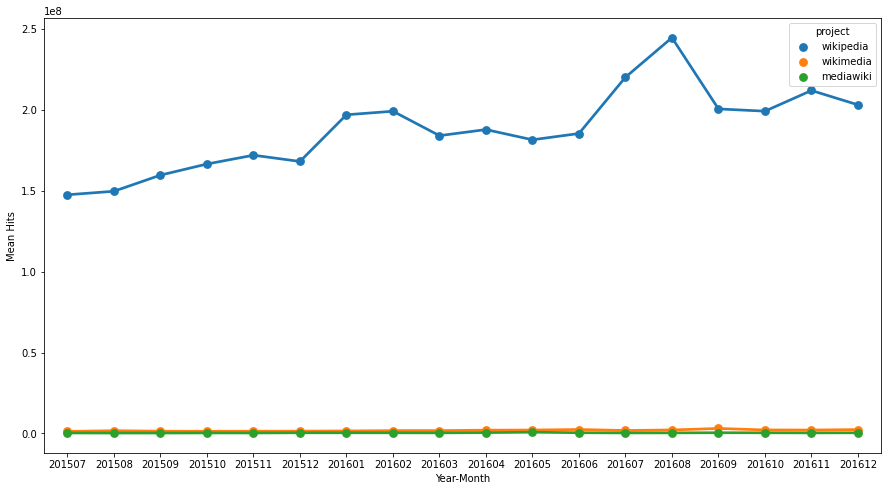

In [ ]:
project_columns = page_details_2['project'].unique()
graph_by("project", project_columns)

Wikipedia project hitting more than any other project.

Now with Wikipedia project in graph, it is hard to visualize other projects. Separate out Wikipedia project and find some patterns if possible.

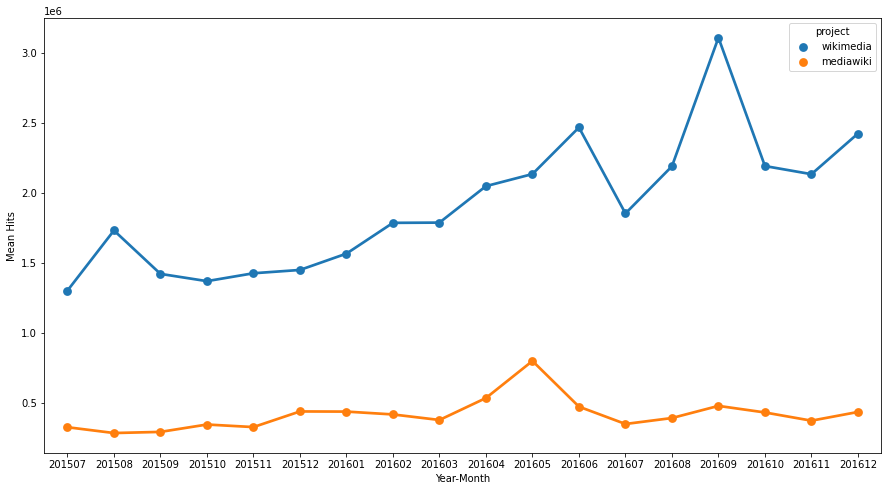

In [ ]:
graph_by("project", [x for i,x in enumerate(project_columns) if i!=0])

It clearly shows that mediawiki pages are rarely visited by users but here some hikes are showing in the Wikimedia pages in September 2016. And there is a hike in mediawiki pages too in May 2016.

### **Visualize Views by Access**

Description of access attributes:

All-access: Pages that permits access to both desktop and mobile users.

Mobile-web: Only mobile users have the ability to access those pages.

Desktop: Only desktop users can access those pages.


In [ ]:
print(train_df['Access'].value_counts())

fig = px.histogram(train_df, x='Access', color="Access")
fig.update_traces(hovertemplate='Access: %{x} <br>Count of Visits: %{y}')
fig.update_layout(showlegend=False, title="Histogram of Visits by Access", title_x=0.5, width=1000,height=500)
fig.show()

all-access    74315
mobile-web    35939
desktop       34809
Name: Access, dtype: int64


Let's plot the access wise monthly mean hits


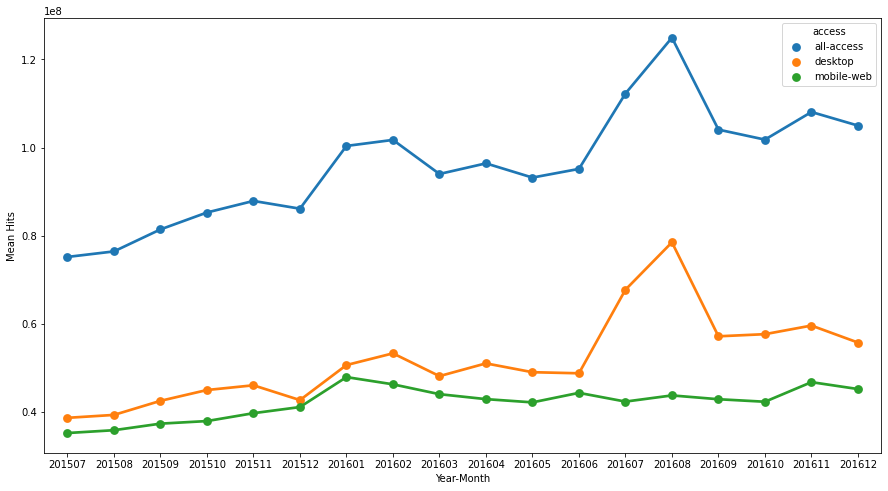

In [ ]:
# looks for the access
access_columns = page_details_2['access'].unique()

graph_by("access", access_columns)

All the pages are accessed but the desktop more rigorously than the mobile users. People prefer to access through the desktop.

All-access value for access are a summation of values for access attributes. So each value other than all-access contributes in trend for all-access

### **Visualize Views by Agent**

**Description of the word "Agent":**

A web crawler, spider, or search engine bot downloads and indexes content from all over the Internet.
Bots are automated software “agents”. The goal of such a bot is to learn what (almost) every webpage on the web is about, so that the information can be retrieved when it's needed. They're called "web crawlers" because crawling is the technical term for automatically accessing a website and obtaining data via a software program.


**Agents Attributes:**

Spider: Spider is an agent

All-agents: Summation of all agents other than spider

In [ ]:
print(train_df['Agent'].value_counts())

fig = px.histogram(train_df, x='Agent', color="Agent")
fig.update_traces(hovertemplate='Agent: %{x} <br>Count of Visits: %{y}')
fig.update_layout(showlegend=False, title="Histogram of Visits by Agent", title_x=0.5, width=1000,height=500)
fig.show()

all-agents    110150
spider         34913
Name: Agent, dtype: int64


Here we have views from all agents and from spider web crawler

Let's plot the agent wise monthly mean hits

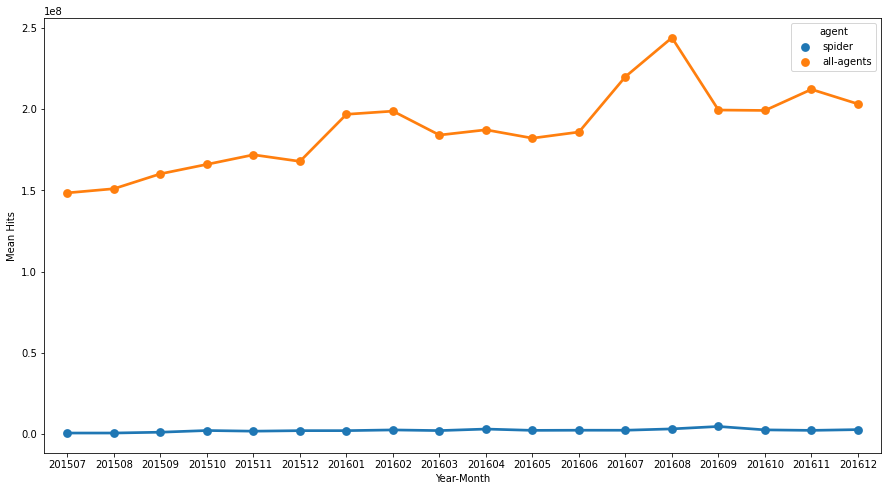

In [ ]:
agents_columns = page_details_2['agent'].unique()

graph_by("agent", agents_columns)

We could not get the data pattern from the above graph. With just two values for agent why not get them plotted in two separate graphs and see how they behave.

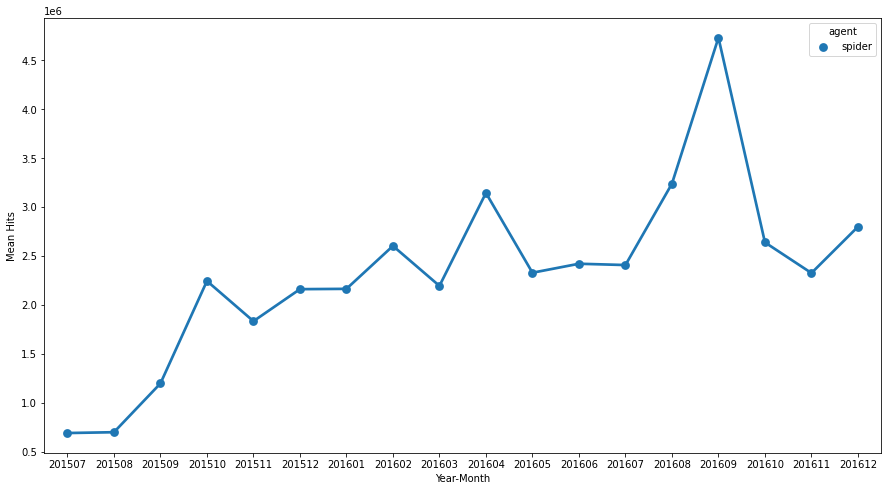

In [ ]:
graph_by("agent", agents_columns[0])

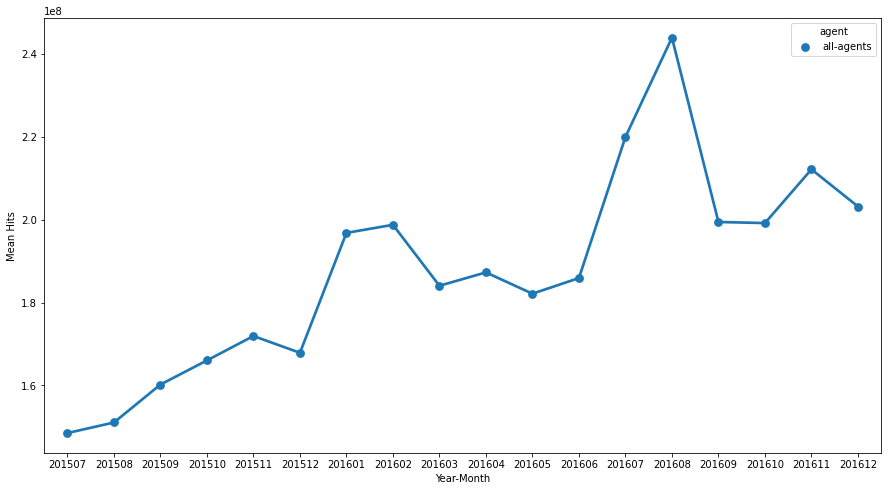

In [ ]:
graph_by("agent", agents_columns[1])

### **Visualize Views by Language**

Look for the different languages present on the Wikipedia page which might affect the dataset by using simple regular expressions. There are some non-Wikipedia pages, these are Wikimedia pages, so give them the code ‘na’ since haven’t determined their language. Many of these will be things like images that do not really have a language.

In [ ]:
print(train_df['Language'].value_counts())

labels={'en':'English','ja':'Japanese','de':'German',
        'na':'Media','fr':'French','zh':'Chinese',
        'ru':'Russian','es':'Spanish'
       }

fig = px.histogram(train_df, x='Language', color="Language")
fig.update_traces(hovertemplate='Language: %{x} <br>Count of Visits: %{y}')
fig.update_layout(showlegend=False, title="Histogram of Visits by Language", title_x=0.5, width=1000,height=500)
fig.show()

en    24108
ja    20431
de    18547
na    17855
fr    17802
zh    17229
ru    15022
es    14069
Name: Language, dtype: int64


There are 7 languages plus the media pages. The languages used here are: English, Japanese, German, French, Chinese, Russian, and Spanish

Create data frames for the different types of entries. After that calculate the sum of all views. The data comes from several different sources, the sum will likely be double-counting some of the views.

In [ ]:
lang_sets = {}
lang_sets['en'] = train_df[train_df.Language=='en'].iloc[:,0:-1]
lang_sets['ja'] = train_df[train_df.Language=='ja'].iloc[:,0:-1]
lang_sets['de'] = train_df[train_df.Language=='de'].iloc[:,0:-1]
lang_sets['na'] = train_df[train_df.Language=='na'].iloc[:,0:-1]
lang_sets['fr'] = train_df[train_df.Language=='fr'].iloc[:,0:-1]
lang_sets['zh'] = train_df[train_df.Language=='zh'].iloc[:,0:-1]
lang_sets['ru'] = train_df[train_df.Language=='ru'].iloc[:,0:-1]
lang_sets['es'] = train_df[train_df.Language=='es'].iloc[:,0:-1]

In [ ]:
sums = {}
for key in lang_sets:
    sums[key] = lang_sets[key].iloc[:,1:-4].sum(axis=0) / lang_sets[key].shape[0]

Now, let’s see what we get

In [ ]:
days = [r for r in range(sums['en'].shape[0])]

fig = go.Figure()
labels={'en':'English','ja':'Japanese','de':'German',
        'na':'Media','fr':'French','zh':'Chinese',
        'ru':'Russian','es':'Spanish'
       }

for key in sums:
    fig.add_trace(go.Scatter(x = days, y = sums[key], name=labels[key]))
    
fig.update_layout( hovermode='x', title='Comparison of sum of views on Language basis', title_x=0.5, width=1200, height=600)

fig.show()

English shows a much higher number of views per page. There is a lot more structure here than expected. The English and Russian plots show very large spikes around day 400 (around August 2016), with several more spikes in the English data later in 2016. My guess is that this is the effect of both the Summer Olympics in August and the election in the US.
There’s also a strange feature in the English data around day 200.
The Spanish data is very interesting too. There is a clear periodic structure there, with an approx 1-week fast period and what looks like a significant dip around every 6 months or so.

Since it looks like there is some periodic structure here, plot each of these separately so that the scale is more visible.

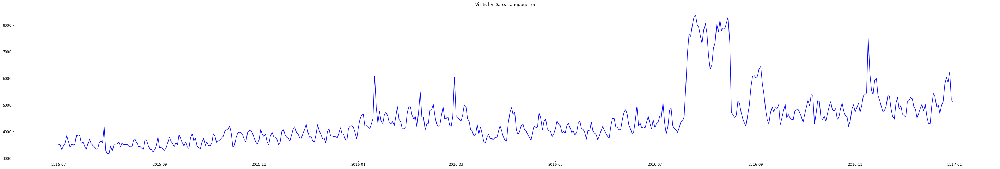

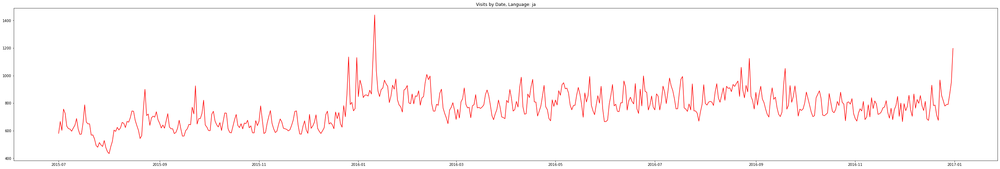

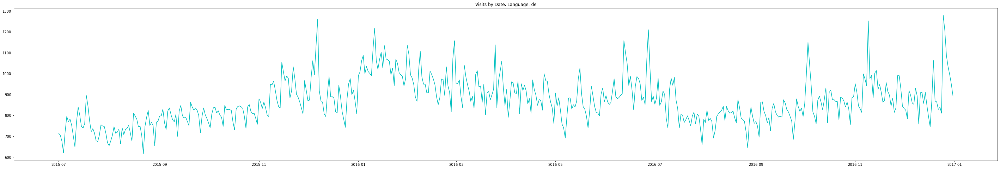

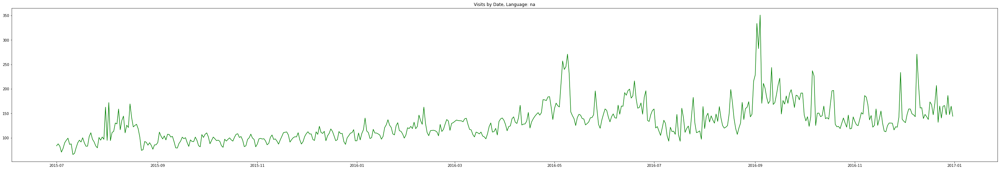

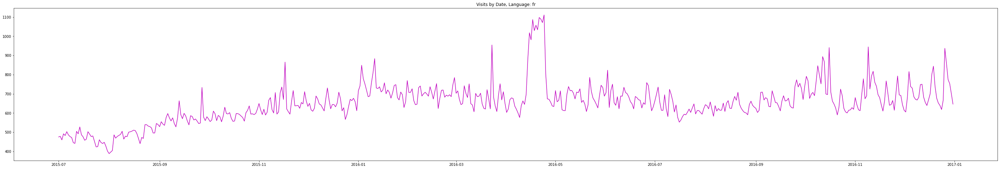

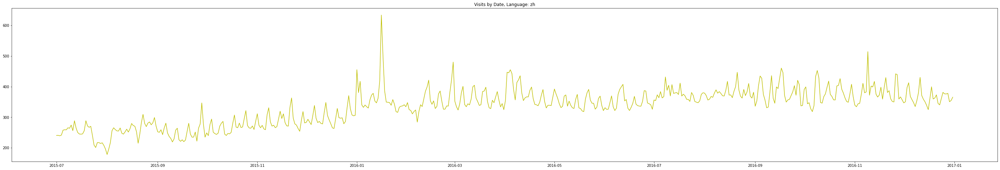

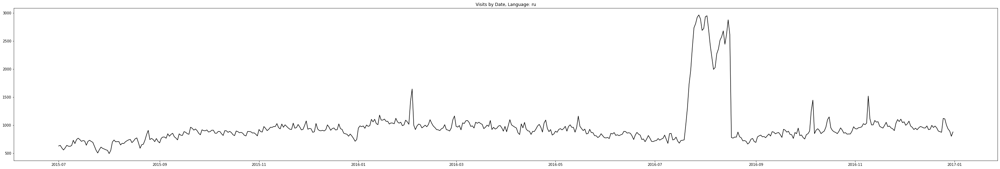

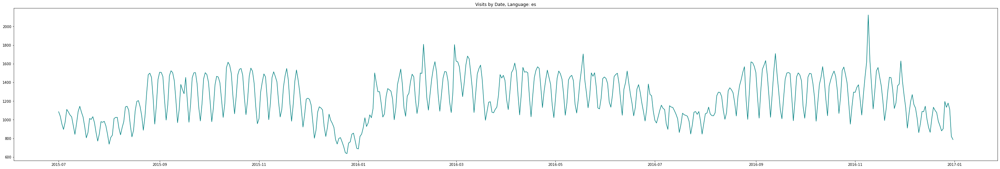

In [ ]:
remove_col = ['Language', 'Name', 'Project', 'Access', 'Agent']

# List of languages 
languages = ['en', 'ja', 'de', 'na', 'fr', 'zh', 'ru', 'es']

color = ['b', 'r', 'c', 'g', 'm', 'y', 'k', 'teal', 'lime']
c = 0

for lang in languages:
    
    # create df
    df = train_df[train_df['Language'] == lang]
    
    # Drop the columns which are not required
    pv = df.drop(remove_col, axis=1)
    
    # Pivot the data for visualization
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    # Call the function for visualization
    visualize_visits(pivot, 'Date', (50, 8), title=f'Visits by Date, Language: {lang}', color=color[c])
    c += 1

#### **Plot for English Wikipedia**
For the first few months, there were only 1 or 2 spikes in the data but after July 2016 there was a rapid hike and after that, traffic has gone down by a large margin.
#### **Plot for Japanese Wikipedia**
Japanese Wikipedia shows some large spikes during January 2016 and we can see that traffic has gone down by a very large margin during September 2015.
#### **Plot for German Wikipedia:**
German Wikipedia has the most number of spikes among all the languages. We can see that this makes the ‘M’ shaped like structure, goes upward then downward and again upward then again downward.
#### **Plot for Wikimedia:**
This plot is for media pages like images. We can see that till April 2016, data doesn’t show any spikes and after that, it has regular spikes and there are also some very large spikes.
#### **Plot for French Wikipedia:**
French Wikipedia shows an upward trend. Spikes can also be seen regularly but there is a large spike around April 2016 and May 2016.
#### **Plot for Chinese Wikipedia:**
Like other languages this one also has an upward trend during the first few months, we can see a very large spike during January 2016.
#### **Plot for Russian Wikipedia:**
Russian Wikipedia does not show a large upward or downward trend but there is a very large spike during Q3 2016. Other than that it has few spikes here and there but not as much as other languages.
#### **Plot for Spanish Wikipedia:**
We can see the nice weekly pattern in the data, regular spikes are thereafter 7 days, and one interesting observation from this plot is that traffic usually goes up during late Q3 or early Q4 and in November 2016, it has a very large spike.


### **Visualize the sudden increase in visits**

From the above visuals we can see that, there was sudden increase in number of visits from the date 2016-07 to 2016-09 and the similar increase in visits was also found in figure where the language was en and ru.

<Figure size 720x1440 with 0 Axes>

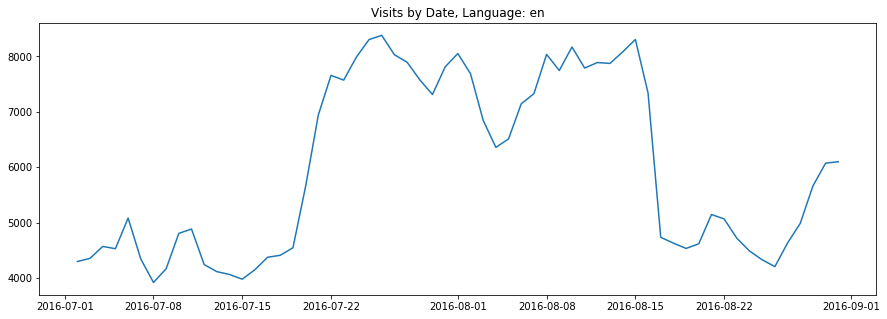

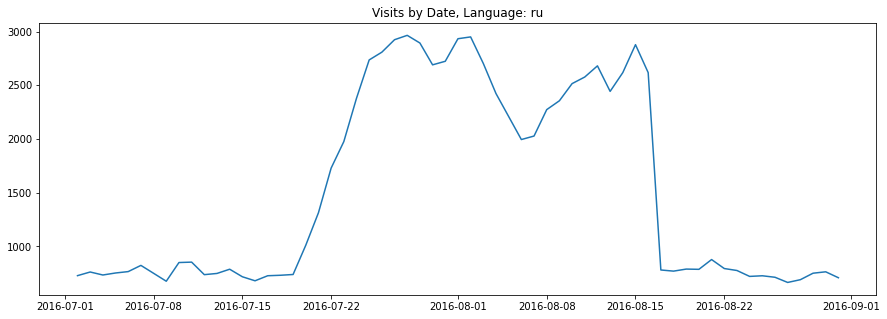

In [ ]:
plt.figure(figsize=(10, 20))
top = 20
c = 1

for lang in ['en', 'ru']:
    
    df = train_df[train_df['Language'] == lang]
    
    # Drop the columns which are not required
    pv = df.drop(remove_col, axis=1)
    
    # Pivot the data for visualization
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot = pivot[(pivot['Date'] > '2016-07-01') & (pivot['Date'] < '2016-09-01')]
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    visualize_visits(pivot, 'Date', (15, 5), title=f'Visits by Date, Language: {lang}')

For exactly 1 month from the date 2016-07-15 to 2016-08-15 the visits were high, visualizing the top visited pages during this interval

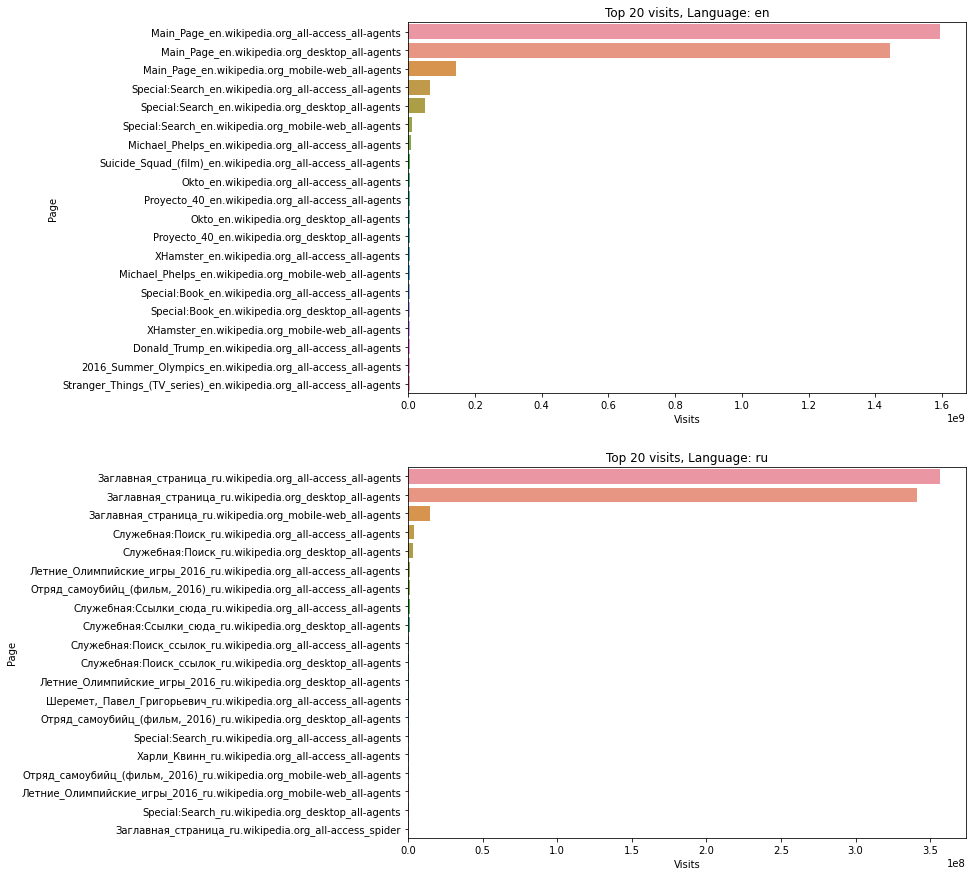

In [ ]:
# Plot the 10 most visited pages according to languages
plt.figure(figsize=(10, 15))

# Top pages to show
top = 20
c = 1

for lang in ['en', 'ru']:
    
    # create df
    df_lang = train_df[train_df['Language'] == lang]
    
    # Drop the columns which are not required
    pv = df_lang.drop(remove_col, axis=1)
    
    # Pivot the data for visualization
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot = pivot[(pivot['Date'] > '2016-07-15') & (pivot['Date'] < '2016-08-15')]
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    # Group the page and sum their visits
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    # Plot the top visits
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(2, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits').set_title(title);
    c += 1

After converting the russian webpage to english, we get that the visits were high due to summer olympics and suicide squad movie. Apart from the visits of homepage these two were common pages for both the language and therefore, this is the reason for sudden increase in visits.

### **Top 10 pages in each language:**

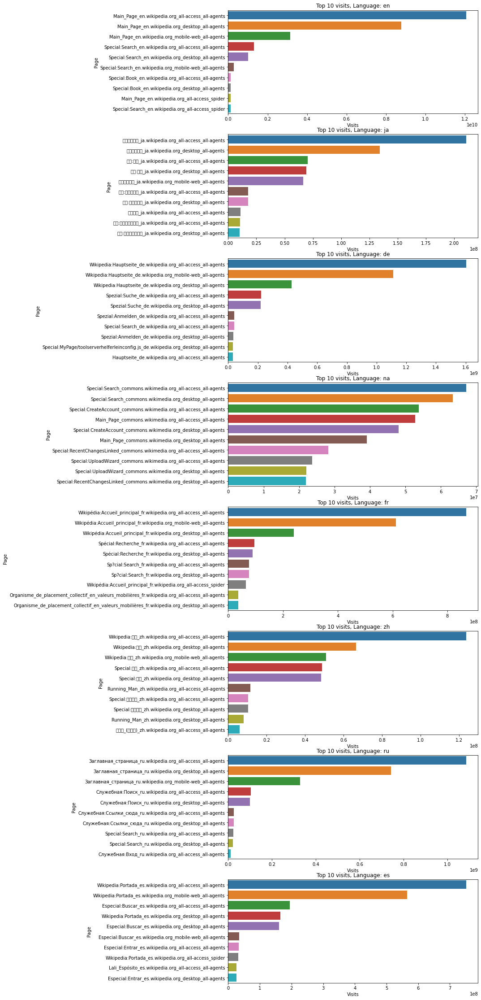

In [ ]:
languages = ['en', 'ja', 'de', 'na', 'fr', 'zh', 'ru', 'es']
# Plot the 10 most visited pages according to languages
plt.figure(figsize=(10, 45))

# Top pages to show
top = 10
c = 1

for lang in languages:
    
    # create df
    df_lang = train_df[train_df['Language'] == lang]
    
    # Drop the columns which are not required
    pv = df_lang.drop(remove_col, axis=1)
    
    # Pivot the data for visualization
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    # Group the page and sum their visits
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    # Plot the top visits
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(9, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits').set_title(title);
    c += 1

### **Which month has more visits on average?**
From here onwards every question that we will try to answer, their average will be based on Median and not on mean.

In [ ]:
from tqdm import trange
from tqdm import tqdm

month=[]
for i in trange(12):
    k=[]
    month.append(k)

for col in tqdm(train_df.columns[1:-5]):
    
    index=int(col.split('-')[1])
    
    month[index-1].append(np.median(train_df[col].values))
    
for i in range(len(month)):
    month[i]=np.median(month[i])
print(month)
print('Month with most number of average visitor is ', month.index(max(month))) 

100%|██████████| 550/550 [00:01<00:00, 530.26it/s]

[113.0, 118.0, 118.0, 123.0, 127.0, 126.0, 90.5, 93.0, 104.5, 108.0, 110.5, 111.0]
Month with most number of average visitor is  4


So, index 4 is for May which shows on average May has the most number of visits. In comparison to July which has the least number of average visitors, May shows a significant 25 % growth.

### **Which day of the week has more visits on average?**

In [ ]:
# Here, we will check which day of the week has most number of visits on average.
from datetime import datetime
import calendar
week_day=[]
for i in trange(7):
    k=[]
    week_day.append(k)
for col in tqdm(train_df.columns[1:-5]):
    index=datetime.strptime(' '.join(col.split('-')), '%Y %m %d').weekday() 
    week_day[index].append(np.median(train_df[col].values))
 
for i in range(len(week_day)):
    week_day[i]=np.median(week_day[i])
print(week_day)    
print('Day with maximum average visitors: ',calendar.day_name[week_day.index(max(week_day))])

100%|██████████| 550/550 [00:00<00:00, 554.51it/s]

[124.5, 123.0, 121.0, 119.0, 118.0, 119.0, 128.0]
Day with maximum average visitors:  Sunday


We can see that on average Sunday has the most number of visitors but all of them are pretty close and don’t have much difference.

### **Does the holiday season affect the number of average visitors?**
As last 3 month of the year has the most number of festivals all over the world. Let's check if it affects the average number of visitors.

In [ ]:
# As we know that last 3 month of the year has most number of festivals all over the world. Lets check if it affects the average visitors.
month=[]
for i in trange(2):
    month.append([])
for col in tqdm(train_df.columns[1:-5]):
    index=int(col.split('-')[1])
    if(index<10):
        month[0].append(np.median(train_df[col].values))
    else:
        month[1].append(np.median(train_df[col].values))
     
for i in range(len(month)):
    month[i]=np.median(month[i])
print('\n')
print(month)    

100%|██████████| 550/550 [00:00<00:00, 562.43it/s]



[121.0, 111.0]


There is some difference here. There is actually a 10 % dip in the average number of visitors during the holiday season.

Conclusion- That it actually make difference, during the holiday season, Wikipedia pages have less traffic in comparison to other months of the year.

This is the end of our EDA, we have analyzed our data in depth which will be useful at later stages of our case study. With this, we conclude this part of the series.

## **Machine Learning**

### Selecting a time series 

In [ ]:
spanish_top_page = train_df.loc[train_df['Page'] == 'Wikipedia:Portada_es.wikipedia.org_all-access_all-agents']

remove_columns = ['Page', 'Name', 'Project', 'Access', 'Agent', 'Language']
spanish_top_page = spanish_top_page.drop(remove_columns, axis=1)

spanish_top_page1 = spanish_top_page.T
spanish_top_page1 = spanish_top_page1.reset_index()
spanish_top_page1.columns = ['date','views']
spanish_top_page1['date'] = pd.to_datetime(spanish_top_page1.date)
spanish_top_page1 = spanish_top_page1.set_index('date')

### Seasonal Decomposition
Time series data can exhibit a variety of patterns, and it is often helpful to split a time series into several components, each representing an underlying pattern category.

There are three types of time series patterns: trend, seasonality and cycles. When we decompose a time series into components, we usually combine the trend and cycle into a single trend-cycle component (sometimes called the trend for simplicity). Thus we think of a time series as comprising three components: a trend-cycle component, a seasonal component, and a remainder component (containing anything else in the time series).

In [ ]:
import plotly.tools as tls
from statsmodels.tsa.seasonal import seasonal_decompose
pd.options.plotting.backend = 'plotly'
from plotly.subplots import make_subplots
def plotSeasonalDecompose(
    x,
    model='additive',
    filt=None,
    two_sided=True,
    extrapolate_trend='freq',
    title="Seasonal Decomposition"):
    result = seasonal_decompose(
            x, model=model, filt=filt,
            two_sided=two_sided, extrapolate_trend=extrapolate_trend, period=225)
    fig = make_subplots(
        rows=4, cols=1,
        subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
    fig.add_trace(
        go.Scatter(x=result.seasonal.index, y=result.observed, mode='lines'),
            row=1, col=1,
        )

    fig.add_trace(
        go.Scatter(x=result.trend.index, y=result.trend, mode='lines'),
            row=2, col=1,
        )

    fig.add_trace(
        go.Scatter(x=result.seasonal.index, y=result.seasonal, mode='lines'),
            row=3, col=1,
        )

    fig.add_trace(
        go.Scatter(x=result.resid.index, y=result.resid, mode='lines'),
            row=4, col=1,
        )
    fig.update_layout(width=1200, height = 1100, showlegend= False)

    return fig.show()

In [ ]:
plotSeasonalDecompose(spanish_top_page1.views)

#### ADF test
ADF test is used to determine the presence of unit root in the series, and hence helps in understand if the series is stationary or not. The null and alternate hypothesis of this test are:

Null Hypothesis: The series has a unit root that it is not stationary.

Alternate Hypothesis: The series has no unit root that the time series is stationary.

p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.

p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

If the null hypothesis in failed to be rejected, this test may provide evidence that the series is non-stationary.

A function is created to carry out the ADF test on a time series.

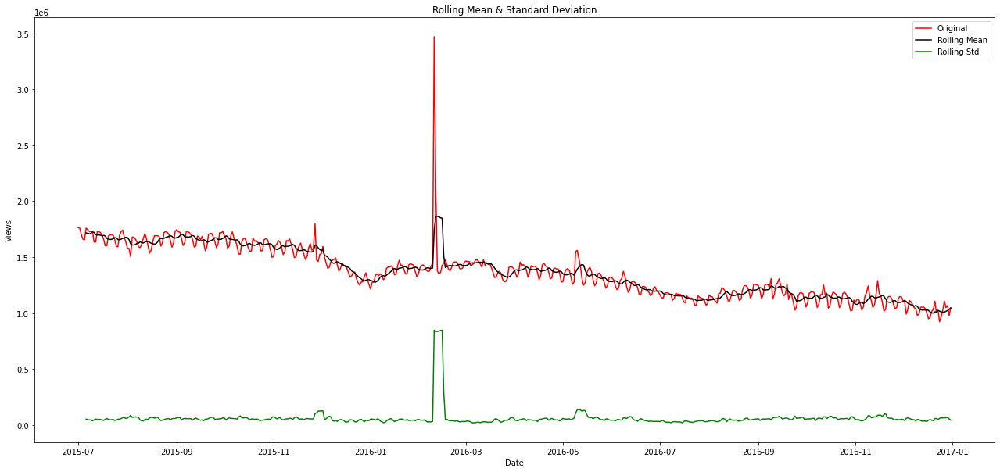

Augmented Dicky Fuller Test Results:
Test statistic:  -1.0608390633954712
p-value:  0.730433621406927
Critical Values: {'1%': -3.442609129942274, '5%': -2.866947348175723, '10%': -2.569649926626197}


In [ ]:
# adfuller library 
from statsmodels.tsa.stattools import adfuller
# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    print('Augmented Dicky Fuller Test Results:')
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = ts.rolling(window=6).mean()
    rolstd = ts.rolling(window=6).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Views")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(spanish_top_page1)
check_adfuller(spanish_top_page1.views)

### Moving average method to remove stationarity

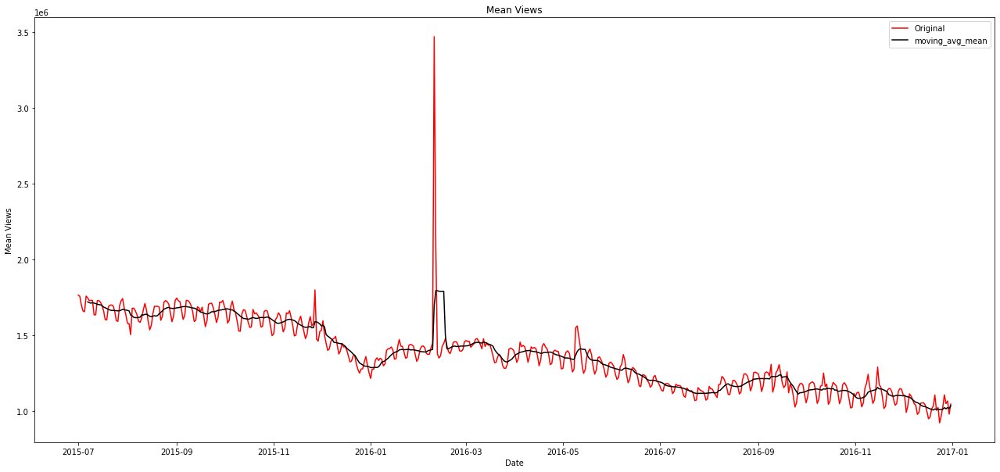

In [ ]:
# Moving average method
pd.options.plotting.backend = 'plotly'
window_size = 7
moving_avg = spanish_top_page1.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(spanish_top_page1.views, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Mean Views")
plt.xlabel("Date")
plt.ylabel("Mean Views")
plt.legend()
plt.show()

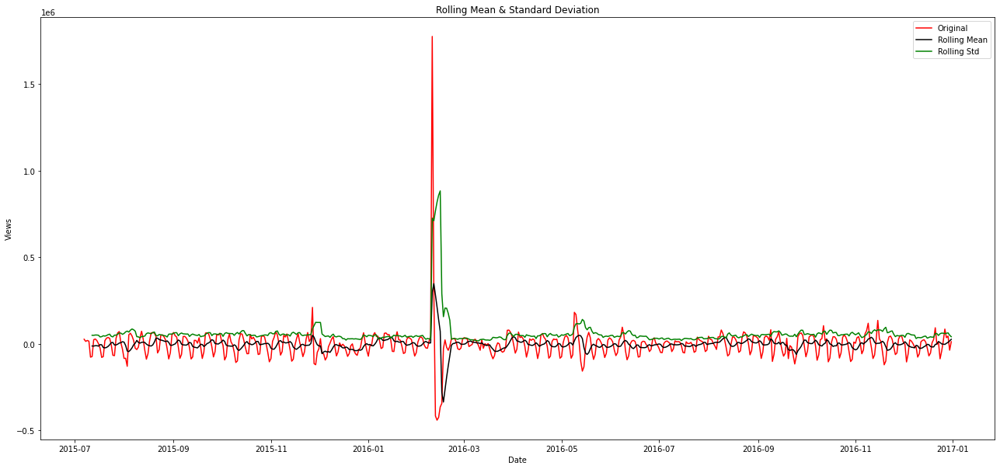

Augmented Dicky Fuller Test Results:
Test statistic:  -10.507171037557363
p-value:  1.0469757922093035e-18
Critical Values: {'1%': -3.442678467240966, '5%': -2.8669778698997543, '10%': -2.5696661916864083}


In [ ]:
ts_moving_avg_diff = spanish_top_page1 - moving_avg
ts_moving_avg_diff.dropna(inplace=True) # first 7 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(ts_moving_avg_diff)
check_adfuller(ts_moving_avg_diff.views)

### ACF and PACF plots

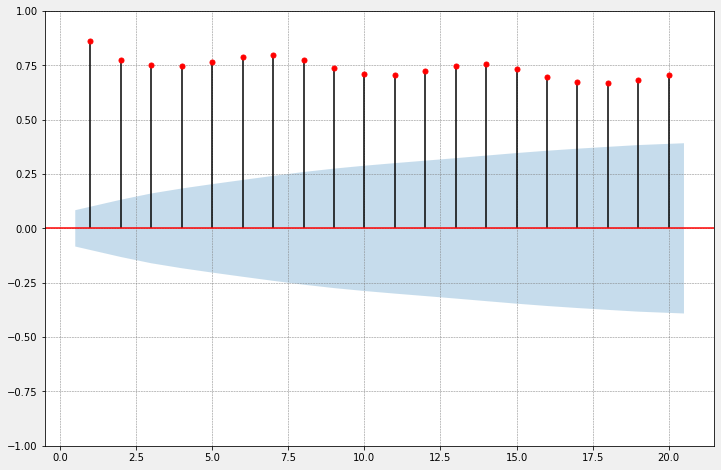

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
# initialize acplot
fig, ax = plt.subplots(nrows=1, ncols=1, facecolor="#F0F0F0", figsize=(12,8))
# autocorrelation subplots
plot_acf(spanish_top_page1, lags=20, alpha=0.05, zero=False, title=None, ax=ax, color="red")
ax.grid(which="major", color="grey", linestyle="--", linewidth=0.5)
plt.show()

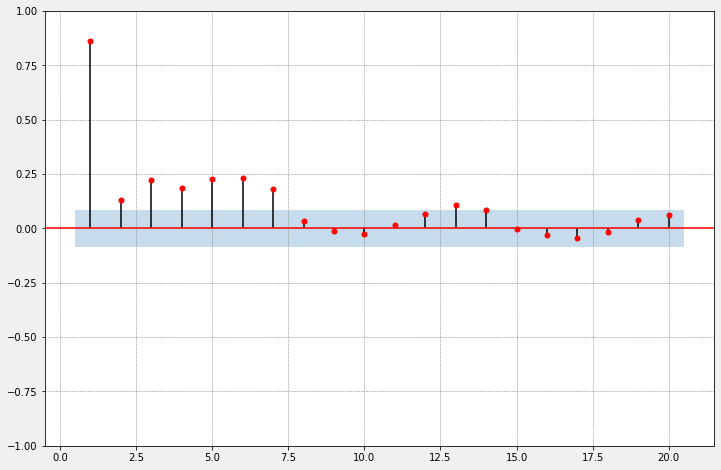

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
# initialize acplot
fig, ax = plt.subplots(nrows=1, ncols=1, facecolor="#F0F0F0", figsize=(12,8))
# partial_autocorrelation subplots
plot_pacf(spanish_top_page1, lags=20, alpha=0.05, zero=False, title=None, ax=ax, color="red")
ax.grid(which="major", color="grey", linestyle="--", linewidth=0.5)
plt.show()

## **ARIMA**

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=12810.974, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=12956.572, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=12834.749, Time=0.53 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=12825.466, Time=0.68 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=12958.733, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=12882.431, Time=0.27 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=12812.726, Time=1.18 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=12811.560, Time=2.31 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=12830.970, Time=0.78 sec
 ARIMA(1,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=9.54 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=12809.101, Time=0.72 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=12893.445, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=12810.981, Time=0.86 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=12809.997, Time=1.52 sec
 ARIMA(1,0,

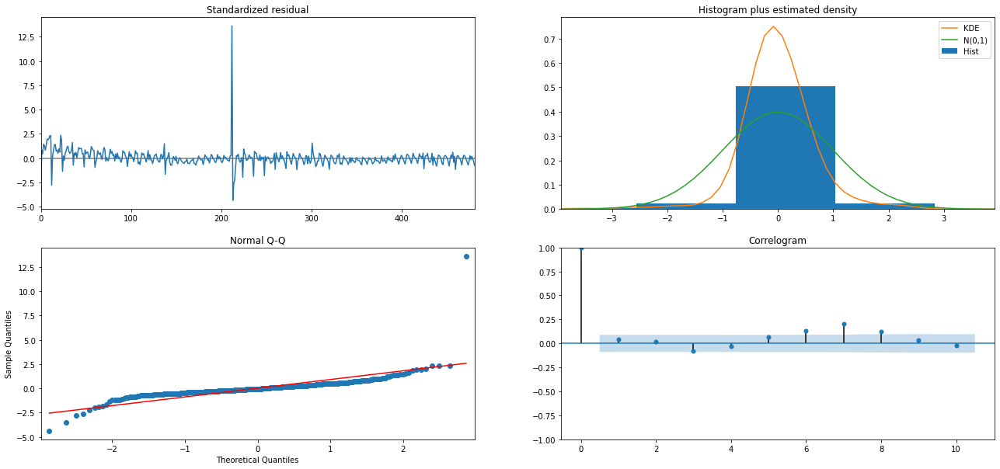

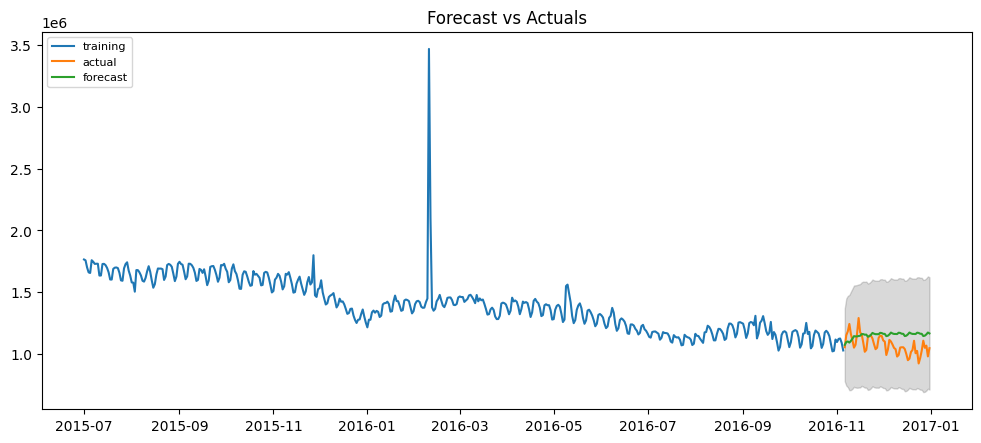

MAPE:
9.44


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

train_1 = spanish_top_page1.loc['2015-01-01':'2016-11-05']
test_1 = spanish_top_page1.loc['2016-11-06':'2016-12-31']

model = pm.auto_arima(train_1, start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,D=1,
                         start_P=0, seasonal=True,
                         d=None, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)
print(model.summary())

test_1 = spanish_top_page1.loc['2016-11-06':'2016-12-31']

model.plot_diagnostics(figsize=(22,10))
plt.show()

# Forecast
fc, confint = model.predict(n_periods=56, return_conf_int=True)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test_1.index)
lower_series = pd.Series(confint[:, 0], index=test_1.index)
upper_series = pd.Series(confint[:, 1], index=test_1.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train_1, label='training')
plt.plot(test_1, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

# Function for MAPE
def get_mape(actual, predicted):
    return print(np.round(np.mean(np.abs((actual-predicted) / actual))*100,2))
print("MAPE:")
get_mape(test_1.views, fc)

In [ ]:
get_mape(test_1.views, fc_series)

9.44


In [ ]:
forecast = model.predict(len(test_1))
pd.options.plotting.backend = 'plotly'
future_forecast = pd.DataFrame(forecast,index = test_1.index,columns=['Prediction'])
pd.concat([test_1,future_forecast],axis=1).plot()

## ETS

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



                       ExponentialSmoothing Model Results                       
Dep. Variable:                    endog   No. Observations:                  494
Model:             ExponentialSmoothing   SSE                  5405851688472.130
Optimized:                         True   AIC                          11441.288
Trend:                         Additive   BIC                          11487.516
Seasonal:                      Additive   AICC                         11442.046
Seasonal Periods:                     7   Date:                 Wed, 06 Oct 2021
Box-Cox:                          False   Time:                         22:04:33
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.1817857                alpha                 True
smoothing_trend          

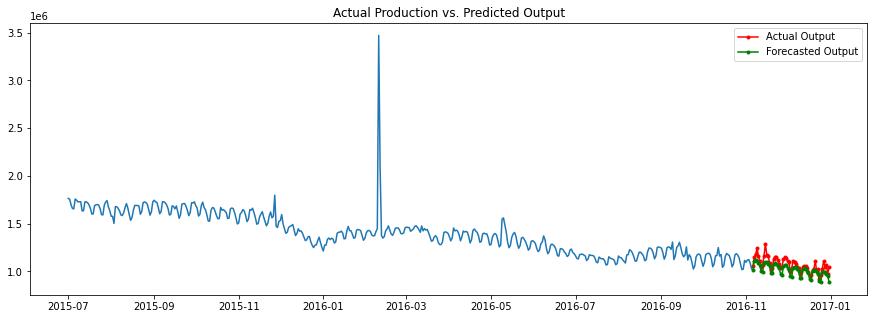

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
fit1 = ExponentialSmoothing(train_1.values, seasonal_periods=7 ,trend='add', seasonal='add',).fit()
# fit1 = ExponentialSmoothing(train_1.values, seasonal_periods=7, trend='add', seasonal='add').fit(use_boxcox=True)
print(fit1.summary())

import math
train_data = train_1
test_data = test_1
y_hat_avg = test_data.copy()
y_hat_avg['Holt_Winter'] = fit1.forecast(len(test_data))
# rms = math.sqrt(mean_squared_error(test_data, y_hat_avg.Holt_Winter))
# print(rms)

# Function for MAPE
def get_mape(actual, predicted):
    return print(np.round(np.mean(np.abs((actual-predicted) / actual))*100,2))
print("MAPE:")
get_mape(test_data.views, y_hat_avg.Holt_Winter)

fig = plt.figure(figsize=(15,5));
plt.plot(train_1, label='training')
future, = plt.plot(test_data.index, test_data, 'r.-', label='Actual Output');
predicted_future, = plt.plot(test_data.index, y_hat_avg.Holt_Winter, 'g.-', label='Forecasted Output');
plt.legend(handles=[future, predicted_future]);
plt.title('Actual Production vs. Predicted Output');

In [ ]:
forecast = fit1.forecast(len(test_data))

pd.options.plotting.backend = 'plotly'
future_forecast = pd.DataFrame(forecast,index = test_1.index,columns=['Prediction'])
pd.concat([test_1,future_forecast],axis=1).plot()

## FB Prophet

In [ ]:
spanish_top_page = train_df.loc[train_df['Page'] == 'Wikipedia:Portada_es.wikipedia.org_all-access_all-agents']
remove_columns = ['Page', 'Name', 'Project', 'Access', 'Agent', 'Language']
spanish_top_page = spanish_top_page.drop(remove_columns, axis=1)

spanish_top_page2 = spanish_top_page.T
spanish_top_page2 = spanish_top_page2.reset_index()
spanish_top_page2.columns = ['ds','y']

train2 = (spanish_top_page2['ds'] >= '2015-07-01') & (spanish_top_page2['ds'] <= '2016-11-05')
train2 = spanish_top_page2.loc[train2]

test2 = (spanish_top_page2['ds'] >= '2016-11-06') & (spanish_top_page2['ds'] <= '2016-12-31')
test2 = spanish_top_page2.loc[test2]
test2 = test2.reset_index()
test2.drop('index', axis='columns', inplace=True)

In [ ]:
converted_train = pd.DataFrame({'ds':train2.ds, 'y':train2.y})
converted_test = pd.DataFrame({'ds':test2.ds, 'y':test2.y})

In [ ]:
from prophet import Prophet

m = Prophet()
m.fit(converted_train)

forecast = m.predict(converted_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
51,2016-12-27,1.128340e+06,9.873962e+05,1.270495e+06
52,2016-12-28,1.156432e+06,1.021548e+06,1.293762e+06
53,2016-12-29,1.116794e+06,9.799560e+05,1.252609e+06
54,2016-12-30,1.073209e+06,9.364199e+05,1.210764e+06
55,2016-12-31,1.019916e+06,8.735648e+05,1.155788e+06


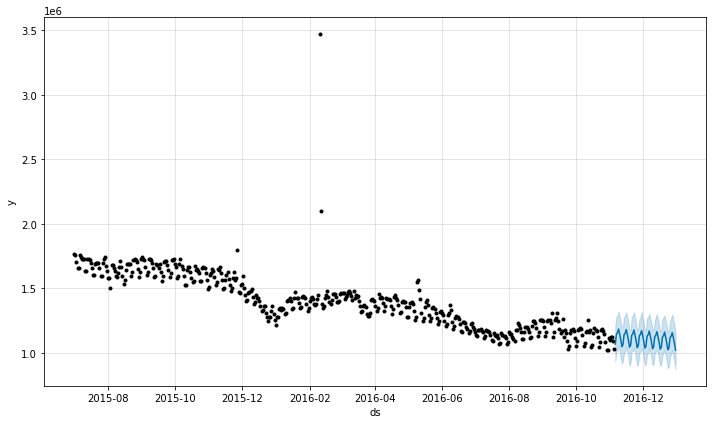

In [ ]:
fig1 = m.plot(forecast)


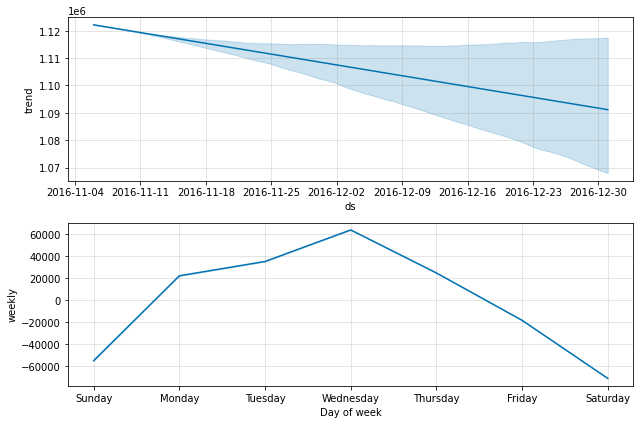

In [ ]:
fig2 = m.plot_components(forecast)


In [ ]:
# Function for MAPE
def get_mape(actual, predicted):
    return print(np.round(np.mean(np.abs((actual-predicted) / actual))*100,2))
print("MAPE:")
get_mape(converted_test.y, forecast.yhat)

MAPE:
4.39


## **Model Comparison**

In [ ]:
pred_prophet = pd.DataFrame({'prophet_ds':forecast.ds,'prophet_yhat':forecast.yhat})
pred_prophet = pred_prophet.reset_index()
pred_prophet.drop('index', axis='columns', inplace=True)

pred_prophet['prophet_ds'] = pd.to_datetime(pred_prophet.prophet_ds)
pred_prophet = pred_prophet.set_index('prophet_ds')

pred_df = pd.DataFrame({'Actual':test_1.views,'Arima':fc_series,'ETS':y_hat_avg.Holt_Winter,'Prophet':pred_prophet.prophet_yhat},index = test_1.index)

In [ ]:
  def get_multiple_mape(actual, arima_predicted, ets_predicted, prophet_predicted):
    # return print("ARIMA MAPE:")
    # return print(np.round(np.mean(np.abs((actual-predicted) / actual))*100,2))
    return print('ARIMA MAPE:', np.round(np.mean(np.abs((actual-arima_predicted) / actual))*100,2), "\n", 'ETS MAPE:', np.round(np.mean(np.abs((actual-ets_predicted) / actual))*100,2), "\n", 'Prophet MAPE:', np.round(np.mean(np.abs((actual-prophet_predicted) / actual))*100,2))

In [ ]:
def comparison_plot2():
  fig = pd.concat([spanish_top_page1,pred_df],axis=1).plot()
  fig1 = pd.concat([pred_df],axis=1).plot()
  return(plotSeasonalDecompose(spanish_top_page1.views),fig.show(),fig1.show())


In [ ]:
def train_models(page_name):
  spanish_top_page = train_df.loc[train_df['Page'] == page_name]
  remove_columns = ['Page', 'Name', 'Project', 'Access', 'Agent', 'Language']
  spanish_top_page = spanish_top_page.drop(remove_columns, axis=1)

  spanish_top_page1 = spanish_top_page.T
  spanish_top_page1 = spanish_top_page1.reset_index()
  spanish_top_page1.columns = ['date','views']
  spanish_top_page1['date'] = pd.to_datetime(spanish_top_page1.date)
  spanish_top_page1 = spanish_top_page1.set_index('date')

  #Arima

  train_1 = spanish_top_page1.loc['2015-01-01':'2016-11-05']
  test_1 = spanish_top_page1.loc['2016-11-06':'2016-12-31']

  model = pm.auto_arima(train_1, start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,D=1,
                         start_P=0, seasonal=True,
                         d=None, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)
  fc, confint = model.predict(n_periods=56, return_conf_int=True)  # 95% conf

  # Make as pandas series
  fc_series = pd.Series(fc, index=test_1.index)
  lower_series = pd.Series(confint[:, 0], index=test_1.index)
  upper_series = pd.Series(confint[:, 1], index=test_1.index)

  #ETS

  fit1 = ExponentialSmoothing(train_1.values, seasonal_periods=7, trend='add', seasonal='add').fit()
  train_data = train_1
  test_data = test_1
  y_hat_avg = test_data.copy()
  y_hat_avg['Holt_Winter'] = fit1.forecast(len(test_data))

  #prophet

  spanish_top_page = train_df.loc[train_df['Page'] == 'Wikipedia:Portada_es.wikipedia.org_all-access_all-agents']
  remove_columns = ['Page', 'Name', 'Project', 'Access', 'Agent', 'Language']
  spanish_top_page = spanish_top_page.drop(remove_columns, axis=1)

  spanish_top_page2 = spanish_top_page.T
  spanish_top_page2 = spanish_top_page2.reset_index()
  spanish_top_page2.columns = ['ds','y']

  train2 = (spanish_top_page2['ds'] >= '2015-07-01') & (spanish_top_page2['ds'] <= '2016-11-05')
  train2 = spanish_top_page2.loc[train2]

  test2 = (spanish_top_page2['ds'] >= '2016-11-06') & (spanish_top_page2['ds'] <= '2016-12-31')
  test2 = spanish_top_page2.loc[test2]
  test2 = test2.reset_index()
  test2.drop('index', axis='columns', inplace=True)

  converted_train = pd.DataFrame({'ds':train2.ds, 'y':train2.y})
  converted_test = pd.DataFrame({'ds':test2.ds, 'y':test2.y})

  m = Prophet()
  m.fit(converted_train)

  forecast = m.predict(converted_test)

  pred_prophet = pd.DataFrame({'prophet_ds':forecast.ds,'prophet_yhat':forecast.yhat})
  pred_prophet = pred_prophet.reset_index()
  pred_prophet.drop('index', axis='columns', inplace=True)

  pred_prophet['prophet_ds'] = pd.to_datetime(pred_prophet.prophet_ds)
  pred_prophet = pred_prophet.set_index('prophet_ds')

  pred_df = pd.DataFrame({'Actual':test_1.views,'Arima':fc_series,'ETS':y_hat_avg.Holt_Winter,'Prophet':pred_prophet.prophet_yhat},index = test_1.index)

  return(comparison_plot2(), get_multiple_mape(test_1.views,fc_series,y_hat_avg.Holt_Winter,pred_prophet.prophet_yhat))


In [ ]:
train_models('Wikipedia:Portada_es.wikipedia.org_all-access_all-agents')

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=12810.974, Time=0.91 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=12956.572, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=12834.749, Time=0.46 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=12825.466, Time=0.65 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=12958.733, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=12882.431, Time=0.24 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=12812.726, Time=1.18 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=12811.560, Time=2.33 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=12830.970, Time=0.73 sec
 ARIMA(1,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=9.60 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=12809.101, Time=0.74 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=12893.445, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=12810.981, Time=0.83 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=12809.997, Time=1.56 sec
 ARIMA(1,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ARIMA MAPE: 9.44 
 ETS MAPE: 5.29 
 Prophet MAPE: 4.39


((None, None, None), None)